# Dynamic Topic Modelling of r/politics subreddit

This project allows:

1. To gather data from Reddit and save it in csv format
2. To clean gathered data and explore it
3. To extract the main topics from gathered data
4. To visualise dynamic changes of topics over time

To extract topics, we use BERTopic library, which performs topic modeling using clustering of vector representations of documents. The main differences between BERTopic and other topic models:

1. High speed due to reducing the dimensionality of vector representations.
2. Modular structure of the model pipeline: the stages of vectorization, dimensionality reduction and clustering are separated from each other, which allows you to easily and quickly experiment with different combinations of algorithm settings.
3. The model pipeline consists of SOTA tools: SBERT, UMAP, HDBSCAN. Combined, this allows you to get the best results compared to other models.

This project can be easily adjusted to other sources of information, which allows you to conduct different experiments.

## Install libraries

In [ ]:
import os
from datetime import datetime
import time
from tqdm import tqdm
import pandas as pd
import spacy
import re

from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired

from sentence_transformers import SentenceTransformer

# from umap import UMAP
from cuml import UMAP

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.feature_extraction.text import CountVectorizer

# from hdbscan import HDBSCAN
from cuml.cluster.hdbscan import HDBSCAN

import plotly.io as pio

pio.renderers.default = "notebook+vscode+jupyterlab"

sns.set_theme(style="darkgrid")
%config InlineBackend.figure_format = "retina"

# Dictionaries:
# en_core_web_sm
# en_core_web_md
# en_core_web_lg
# en_core_web_trf

nlp = spacy.load(
    "en_core_web_sm",
    exclude=["tok2vec", "tagger", "parser", "attribute_ruler", "lemmatizer", "ner"],
)

spacy_stopwords = list(spacy.lang.en.stop_words.STOP_WORDS)

## Load and clean data from csvs

BERTopic uses Transformers. The model learns better if it receives more information from the text. Therefore, preprocessing is minimal.

### Function to clean data from HTML elements using regular expressions

In [ ]:
def regex_preprocessing(text):
    # Remove URL
    text = re.sub(
        r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+",
        " ",
        text,
    )

    text = re.sub(
        r"\(http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+\)",
        " ",
        text,
    )

    # Remove special symbols
    text = re.sub(r"\n|\r|\<.*?\>|\{.*?\}|u/|\(.*emote.*\)|\[gif\]|/s|_", " ", text)
    text = re.sub(r"[^\w0-9'’“”%!?.,-:*()><]", " ", text)

    # Remove unnecessary brackets
    text = re.sub(r"\s\(\s", " ", text)

    # Delete unnecessary whitespaces
    text = re.sub(r"\s+", " ", text)
    return text.strip()

### Function to convert data to a dataframe, drop duplicates in the dataframe and to apply 'regex_preprocessing' function to data

In [5]:
def data_preprocessing(file_name):
    data = pd.read_csv(file_name)
    data_cleaned = data.drop_duplicates(keep=False)
    data_cleaned["comments"] = data_cleaned["comments"].apply(regex_preprocessing)

    return data_cleaned

### Function to create a dataframe with a cleaned data

This function consists of several steps:
1. Firstly, it gets names of csv files in a chosen folder
2. Secondly, it applies 'data_preprocessing' function to csv's to create dataframes with cleaned data
2. Lastly, it creates a combined dataframe with cleaned data

In [6]:
def process_data(directory):
    file_names = []
    for filename in os.listdir(directory):
        file = os.path.join(directory, filename)
        file_names.append(file)
    file_names.sort()

    dataframes = []
    for name in file_names:
        dataframes.append(data_preprocessing(name))

    cleaned_df = (
        pd.concat(dataframes)
        .drop(columns="time", axis=1)
        .reset_index(drop=True)
        .drop_duplicates()
        .dropna()
    )

    return cleaned_df

### Apply data processing functions to gathered data

For this experiment, we load cvs's with data marked as 'hot' by reddit algorithms.

In [7]:
directory = "original_data/hot"
combined_df = process_data(directory)
len(combined_df["comments"].to_list())

264230

### Convert the dataframe to a list for a further work

In [8]:
comments = combined_df["comments"].to_list()
timestamps = combined_df["date"].to_list()

## Create embeddings from cleaned data

The gte-small model was chosen using the Hugging Face benchmark. It is lightweight and works well with Reddit data.

In [9]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer(
    model_name_or_path="thenlper/gte-small",
    cache_folder="transformers_cache",
)
embeddings = embedding_model.encode(comments, show_progress_bar=True)

Batches:   0%|          | 0/8258 [00:00<?, ?it/s]

## Plot data distribution

We use umap to reduce the dimensionality of the data, which makes it easier to cluster the data using HDBSCAN.

In [22]:
def plot_umap(embeddings, values):
    neighbors_list = values

    fig, axes = plt.subplots(2, 5, figsize=(27, 10), sharex=True, sharey=True)

    axes = axes.flatten()
    for ax, neighbors in tqdm(zip(axes, neighbors_list)):
        umap_model = UMAP(
            n_neighbors=neighbors, n_components=2, min_dist=0.0, metric="cosine"
        )
        # Apply UMAP to our data
        umap_result = umap_model.fit_transform(embeddings)
        # Visualise the results
        ax.scatter(
            umap_result[:, 0], umap_result[:, 1], alpha=0.3, c="orangered", s=0.2
        )
        ax.set_title(f"UMAP, n_neighbors = {neighbors}")
        ax.set_xlabel("Компонента 1")
        ax.set_ylabel("Компонента 2")
    lim = 7
    plt.ylim(-lim, lim)
    plt.xlim(-lim, lim)
    plt.tight_layout()
    plt.show()


def plot_hdbscan(embeddings, umap_values, hdbscan_values):
    for n in umap_values:
        # Apply UMAP to our data
        umap_model = UMAP(n_neighbors=n, n_components=2, min_dist=0.0, metric="cosine")
        umap_result = umap_model.fit_transform(embeddings)

        # HDBSCAN
        sizes = hdbscan_values

        fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True)

        axes = axes.flatten()
        for ax, size in tqdm(zip(axes, sizes)):
            # Cluster data with HDBSCAN
            hdbscan_model = HDBSCAN(
                min_cluster_size=size, metric="euclidean", prediction_data=True
            )
            hdbscan_labels = hdbscan_model.fit_predict(umap_result)
            # Create a dataframe with results of UMAP and HDBSCAN
            df = pd.DataFrame(
                umap_result, columns=[f"UMAP{i+1}" for i in range(0, 2, 1)]
            )
            df["Cluster"] = hdbscan_labels
            # scatterplot for results
            sns.scatterplot(
                x="UMAP1",
                y="UMAP2",
                hue="Cluster",
                data=df,
                palette="tab10",
                legend=None,
                linewidth=0,
                s=1,
                ax=ax,
            ).set_title(f"n_neighbors={n}, min_cluster_size={size}")
            ax.set_xlabel("Компонента 1")
            ax.set_ylabel("Компонента 2")
        lim = 7
        plt.ylim(-lim, lim)
        plt.xlim(-lim, lim)
        plt.tight_layout()
        plt.show()

We plot a range of values to see how a structure of data changes: from a more local structure to a global one.

10it [01:02,  6.29s/it]


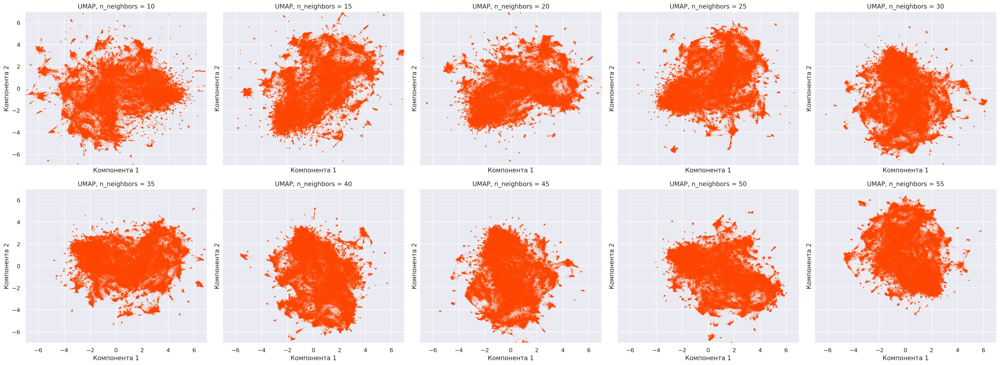

In [23]:
plot_umap(embeddings, np.arange(10, 56, 5))

We can see sizes of created clusters with different parameter combinations.

4it [01:57, 29.40s/it]


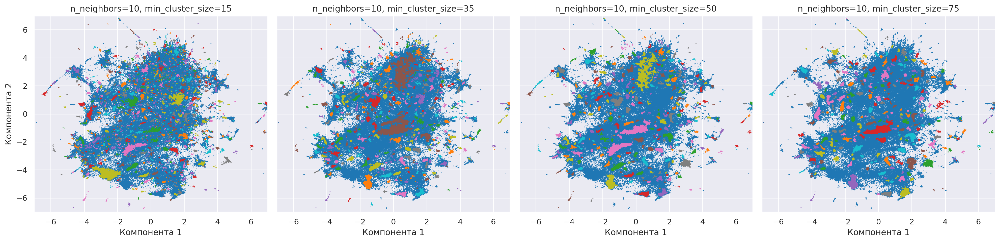

4it [02:06, 31.69s/it]


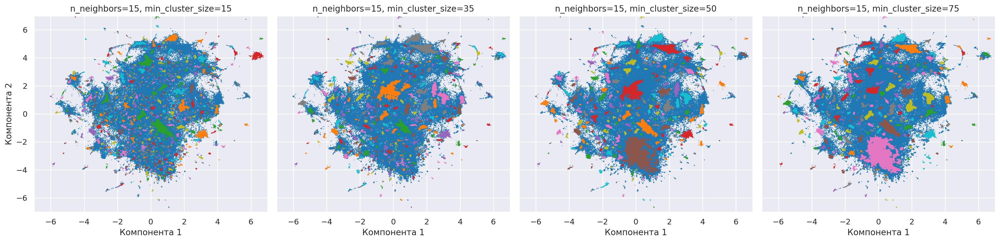

4it [01:59, 29.95s/it]


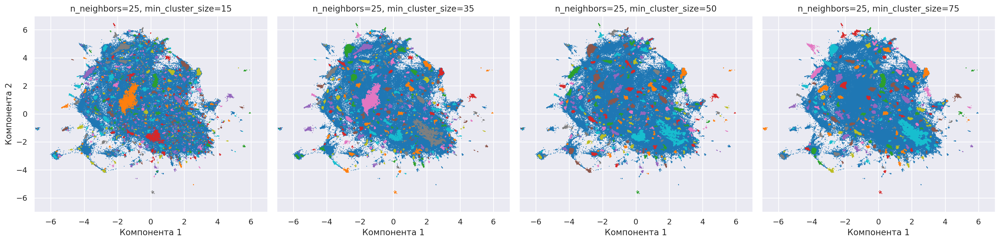

In [24]:
plot_hdbscan(embeddings, [10, 15, 25], [15, 35, 50, 75])

## Extract topics using BERTopic

This part is purely experimental and requires a lot of time to tune hyperparameters of models to get the best ouput results.

Current hyperparameters are chosen taking into account the goals:

1. Preserve the local structure of the data after reducing the dimensionality of the data with UMAP
2. Reduce the amount of noise in clusters and create an adequate number of topics with HDBSCAN
3. Create a list of understandable topics at the output

In this experiment, we use MaximalMarginalRelevance topic representation model, which changes the order of words in topics to remove semantic repetitions and create a sequence of the most significant words.

We use CountVectorizer from scikit-learn to:
1. remove very rare and frequent words from the final topic representations
2. create n-grams, up to 2 words in total
3. remove stopwords using spaCy stopwords list

### Start Topic Modelling Pipeline

In [47]:
# UMAP init
umap_model = UMAP(n_neighbors=25, n_components=5, min_dist=0.0, metric="cosine")

# HDBSCAN init
hdbscan_model = HDBSCAN(min_cluster_size=50, metric="euclidean", prediction_data=True)

# Remove noise from created topics
vectorizer_model = CountVectorizer(
    stop_words=spacy_stopwords, min_df=0.03, max_df=0.99, ngram_range=(1, 2)
)

# BERTopic model init
representation_model = MaximalMarginalRelevance()
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    verbose=True,
)

# Fit the model
topics, probs = topic_model.fit_transform(comments, embeddings)

2024-12-06 01:40:34,066 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-06 01:40:56,733 - BERTopic - Dimensionality - Completed ✓
2024-12-06 01:40:56,737 - BERTopic - Cluster - Start clustering the reduced embeddings


[I] [01:40:42.527570] Transform can only be run with brute force. Using brute force.


2024-12-06 01:41:48,358 - BERTopic - Cluster - Completed ✓
2024-12-06 01:41:48,395 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-06 01:42:06,614 - BERTopic - Representation - Completed ✓


### Get topics

In [48]:
# Get topics
topic_representation = topic_model.get_topic_info()

In [49]:
topic_representation["Name"].to_list()

['-1_trump_vote_election_democrats',
 '0_harris_voted harris_vote harris_harris win',
 '1_campaign_didn_win_district',
 '2_rfk_vaccines_vaccine_rfk jr',
 '3_trump_trump supporters_voted trump_donald trump',
 '4_hitler_fascist_nazi_fascism',
 '5_deported_deport_deportation_immigration',
 '6_israel_gaza_palestine_palestinians',
 '7_russia_putin_ukraine_russian',
 '8_women_wives_husbands_women voted',
 '9_inflation_tariffs_economy_prices',
 '10_church_christian_christians_religion',
 '11_kamala_vote kamala_voted kamala_kamala wins',
 '12_media_fox news_propaganda_journalism',
 '13_biden_joe biden_blame biden_biden said',
 '14_popular vote_vote_election_votes',
 '15_vote_vote vote_polling_polls vote',
 '16_abortion_roe_abortions_pro life',
 '17_tells like_won_knows_tells',
 '18_thank_thanks_good_cool',
 '19_trans_trans people_gender_transgender',
 '20_democrats_dems_blame_democratic party',
 '21_musk_elon musk_tesla_trump musk',
 '22_america_american_americans_usa',
 '23_rapist_rape_pedoph

## Dynamic Topic Modelling 

In [50]:
# Get topics over time
topics_over_time = topic_model.topics_over_time(
    comments,
    timestamps,
    datetime_format="%Y_%m_%d",
    global_tuning=True,
    evolution_tuning=True,
    nr_bins=20,
)

16it [02:06,  7.88s/it]


### Topics over Time Plot

In [51]:
import plotly.io as pio

pio.renderers.default = "notebook+vscode+jupyterlab"

In [52]:
topic_model.visualize_topics_over_time(
    topics_over_time, top_n_topics=10, height=700, width=1400
)

### Normalized Topics over Time Plot

In [53]:
topic_model.visualize_topics_over_time(
    topics_over_time, top_n_topics=10, height=700, width=1200, normalize_frequency=True
)